# SR Quality Assessment Notebook

Comprehensive evaluation of Super-Resolution model performance with:
- **Custom patch selection**: Choose specific patches for detailed analysis
- **Predefined center patch**: Reference comparison
- **Random sampling**: Statistical overview across image
- **PNG viewing & histograms**: Input image visualization
- **4-method assessment**: Crop comparison, frequency analysis, error maps, interpretation

## 1. Setup & Imports

In [1]:
import os
from pathlib import Path
from PIL import Image, ImageFile
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
import warnings
warnings.filterwarnings('ignore')

print("✓ All libraries loaded successfully")

✓ All libraries loaded successfully


## 2. PNG Viewing & Histogram Functions

In [2]:
# ==================================================================
# INTELLIGENT IMAGE LOADER - Handles BOTH Geospatial + PNG formats
# ==================================================================

def load_large_png_tiled(image_path: str, scale_factor: int = 8, tile_size: int = 512):
    """
    Memory-efficient PNG loader using tiling + downsampling.
    
    Parameters
    ----------
    image_path : str
        Path to PNG file
    scale_factor : int
        Downsampling factor (e.g., 8 = 1/8 size)
    tile_size : int
        Tile size for reading blocks (prevent OOM)
    
    Returns
    -------
    rgb : np.ndarray (H, W, 3) uint8
        Downsampled RGB image
    """
    # Allow valid large satellite PNGs by disabling PIL size limits for this loader only
    Image.MAX_IMAGE_PIXELS = None
    ImageFile.LOAD_TRUNCATED_IMAGES = True
    img = Image.open(image_path)
    
    # Get original dimensions
    orig_width, orig_height = img.size
    downsampled_width = orig_width // scale_factor
    downsampled_height = orig_height // scale_factor
    
    print(f"[PNG Tiled Loader]")
    print(f"  Original size: {orig_width} × {orig_height}")
    print(f"  Scale factor: {scale_factor}×")
    print(f"  Output size: {downsampled_width} × {downsampled_height}")
    print(f"  Tile size: {tile_size}")
    
    # Create output array
    rgb_out = np.zeros((downsampled_height, downsampled_width, 3), dtype=np.uint8)
    
    # Process image in tiles
    num_tiles_h = (orig_height + tile_size - 1) // tile_size
    num_tiles_w = (orig_width + tile_size - 1) // tile_size
    total_tiles = num_tiles_h * num_tiles_w
    
    tile_count = 0
    for tile_y in range(0, orig_height, tile_size):
        for tile_x in range(0, orig_width, tile_size):
            tile_count += 1
            if tile_count % max(1, total_tiles // 10) == 0 or tile_count == total_tiles:
                print(f"  Progress: {tile_count}/{total_tiles} tiles")
            if tile_count % max(1, total_tiles // 10) == 0 or tile_count == total_tiles:
                print(f"  Progress: {tile_count}/{total_tiles} tiles")
            
            # Read tile region
            x1, y1 = tile_x, tile_y
            x2 = min(tile_x + tile_size, orig_width)
            y2 = min(tile_y + tile_size, orig_height)
            
            tile = img.crop((x1, y1, x2, y2))
            tile_array = np.array(tile, dtype=np.uint8)
            
            # Handle grayscale → RGB
            if tile_array.ndim == 2:
                tile_array = np.stack([tile_array] * 3, axis=2)
            elif tile_array.shape[2] == 4:  # RGBA → RGB
                tile_array = tile_array[:, :, :3]
            
            # Downsample tile
            h, w = tile_array.shape[:2]
            h_down = max(1, h // scale_factor)
            w_down = max(1, w // scale_factor)
            tile_down = np.array(
                Image.fromarray(tile_array).resize((w_down, h_down), Image.Resampling.LANCZOS)
            )
            
            # Write to output
            out_y1 = (tile_y // scale_factor)
            out_x1 = (tile_x // scale_factor)
            out_y2 = out_y1 + h_down
            out_x2 = out_x1 + w_down
            rgb_out[out_y1:out_y2, out_x1:out_x2] = tile_down
    
    print(f"  ✓ Loaded successfully")
    return rgb_out


def display_png_overview(image_path: str, scale_factor: int = 8):
    """Display PNG image with histograms and statistics."""
    rgb = load_large_png_tiled(image_path, scale_factor)
    rgb_float = rgb.astype(np.float32)
    
    low = np.percentile(rgb_float, 2)
    high = np.percentile(rgb_float, 98)
    rgb_display = (rgb_float - low) / (high - low)
    rgb_display = np.clip(rgb_display, 0, 1)
    
    # Display
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    ax1.imshow(rgb_display)
    ax1.set_title(f"Image Preview (downsampled {scale_factor}×, 2-98% stretch)")
    ax1.axis("off")
    
    # Histograms
    for i, label in enumerate(["Red", "Green", "Blue"]):
        ax2.hist(rgb[:, :, i].ravel(), bins=256, alpha=0.4, label=label)
    ax2.set_title("RGB Histograms")
    ax2.set_xlabel("Pixel Value")
    ax2.set_ylabel("Frequency")
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Statistics
    print(f"\n{'='*70}")
    print("IMAGE STATISTICS")
    print(f"{'='*70}")
    print(f"Shape (downsampled): {rgb.shape}")
    for i, label in enumerate(["Red", "Green", "Blue"]):
        ch = rgb[:, :, i]
        print(f"{label:5s}: min={ch.min():3d}  max={ch.max():3d}  mean={ch.mean():7.1f}  std={ch.std():7.1f}")

## 3. SR Quality Assessment Core Functions

In [18]:
# Paths
lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/lr_x2/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1.png"
sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/sr_x2/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1_SwinIR.png"
hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/airbus/outputs/hr_processed/IMG_PNEO3_STD_202601250555400_PMS-FS_ORT_1e224074-3a2a-4f29-cfe4-ab0a484fbd47_RGB_R1C1.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/lr_x2/22MAR22095810-S2AS-050012575010_01_P001.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/sr_x2/22MAR22095810-S2AS-050012575010_01_P001_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Rome_Colosseum_2022-03-22_WV03_HD_01_P001/hr_processed/22MAR22095810-S2AS-050012575010_01_P001.png"

# lr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Barcelona_2022-04-01_WV03_HD/lr_x2/22APR01105255-S3DS_R1C1-050012560010_01_P001.png"
# sr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/lr-degraded-outputs/Barcelona_2022-04-01_WV03_HD/sr_x2/22APR01105255-S3DS_R1C1-050012560010_01_P001_SwinIR.png"
# hr_path = r"/home/hassan/Documents/Hassan/SR-Enhancement-Work/Datasets/maxar-samples/Barcelona_2022-04-01_WV03_HD/050012560010_01/050012560010_01_P001_PSH/22APR01105255-S3DS_R1C1-050012560010_01_P001.TIF"

# Load images
lr_img = cv2.imread(lr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0
sr_img = cv2.imread(sr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0
hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR).astype(np.float32) / 255.0

print(f"LR shape: {lr_img.shape}")
print(f"SR shape: {sr_img.shape}")
print(f"HR shape: {hr_img.shape}")

# Pre-compute bicubic baseline
lr_bicubic_full = cv2.resize(lr_img, (sr_img.shape[1], sr_img.shape[0]), interpolation=cv2.INTER_CUBIC)
print(f"\n✓ Images loaded and bicubic baseline computed")

LR shape: (8042, 5520, 3)
SR shape: (16084, 11040, 3)
HR shape: (16084, 11040, 3)

✓ Images loaded and bicubic baseline computed


In [19]:
def analyze_patch(crop_size=256, center_x=None, center_y=None, title_prefix=""):
    """Analyze a specific patch. If center not specified, uses image center."""
    
    sr_h, sr_w = sr_img.shape[:2]
    
    # Default to center if not specified
    if center_x is None:
        center_x = sr_w // 2
    if center_y is None:
        center_y = sr_h // 2
    
    # Extract SR patch
    x1 = max(0, center_x - crop_size // 2)
    x2 = min(sr_w, x1 + crop_size)
    y1 = max(0, center_y - crop_size // 2)
    y2 = min(sr_h, y1 + crop_size)
    
    sr_crop = sr_img[y1:y2, x1:x2]
    hr_crop = hr_img[y1:y2, x1:x2]
    
    # Extract LR patch
    lr_y1, lr_y2 = y1 // 2, y2 // 2
    lr_x1, lr_x2 = x1 // 2, x2 // 2
    lr_crop = lr_img[lr_y1:lr_y2, lr_x1:lr_x2]
    
    # Calculate metrics
    psnr_sr_hr = psnr(hr_crop, sr_crop, data_range=1.0)
    ssim_sr_hr = ssim(hr_crop, sr_crop, data_range=1.0, channel_axis=2)
    
    lr_bicubic = cv2.resize(lr_crop, (sr_crop.shape[1], sr_crop.shape[0]), interpolation=cv2.INTER_CUBIC)
    psnr_bic_hr = psnr(hr_crop, lr_bicubic, data_range=1.0)
    ssim_bic_hr = ssim(hr_crop, lr_bicubic, data_range=1.0, channel_axis=2)
    
    # Display
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(cv2.cvtColor((lr_bicubic * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"LR (Bicubic)\nPSNR={psnr_bic_hr:.2f} dB")
    axes[0].axis("off")
    
    axes[1].imshow(cv2.cvtColor((sr_crop * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"SR (SwinIR)\nPSNR={psnr_sr_hr:.2f} dB")
    axes[1].axis("off")
    
    axes[2].imshow(cv2.cvtColor((hr_crop * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[2].set_title(f"HR (PSNR Reference)")
    axes[2].axis("off")
    
    gain = psnr_sr_hr - psnr_bic_hr
    plt.suptitle(f"{title_prefix}Crop ({crop_size}×{crop_size}) @ pos ({center_x}, {center_y})\nGain: {gain:+.2f} dB | SSIM: {ssim_sr_hr:.4f}\n", 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Metrics
    print(f"\n{'='*70}")
    print(f"{title_prefix}Patch Analysis at ({center_x}, {center_y})")
    print(f"{'='*70}")
    print(f"SR-PSNR:      {psnr_sr_hr:.2f} dB")
    print(f"SR-SSIM:      {ssim_sr_hr:.4f}")
    print(f"Bicubic-PSNR: {psnr_bic_hr:.2f} dB")
    print(f"Bicubic-SSIM: {ssim_bic_hr:.4f}")
    print(f"PSNR Gain:    {gain:+.2f} dB  {'✓ SR better!' if gain > 0 else '✗ Worse'}")
    
    return sr_crop, hr_crop, lr_bicubic, psnr_sr_hr, ssim_sr_hr, psnr_bic_hr, ssim_bic_hr

## 3b. Full-Image PSNR & SSIM Metrics

In [20]:
# Full-image PSNR and SSIM calculation
psnr_sr_hr_full = psnr(hr_img, sr_img, data_range=1.0)
ssim_sr_hr_full = ssim(hr_img, sr_img, data_range=1.0, channel_axis=2)

psnr_bic_hr_full = psnr(hr_img, lr_bicubic_full, data_range=1.0)
ssim_bic_hr_full = ssim(hr_img, lr_bicubic_full, data_range=1.0, channel_axis=2)

psnr_gain_full = psnr_sr_hr_full - psnr_bic_hr_full

print(f"\n{'='*70}")
print("FULL-IMAGE SR QUALITY METRICS (vs. HR Reference)")
print(f"{'='*70}")
print(f"\nSuperResolution (SwinIR) vs HR:")
print(f"  PSNR: {psnr_sr_hr_full:.2f} dB")
print(f"  SSIM: {ssim_sr_hr_full:.4f}")
print(f"\nBicubic Upsampling vs HR:")
print(f"  PSNR: {psnr_bic_hr_full:.2f} dB")
print(f"  SSIM: {ssim_bic_hr_full:.4f}")
print(f"\nGain (SR - Bicubic):")
print(f"  PSNR Gain: {psnr_gain_full:+.2f} dB  {'✓ SR Better' if psnr_gain_full > 0 else '✗ Worse'}")
print(f"  SSIM Gain: {ssim_sr_hr_full - ssim_bic_hr_full:+.4f}")
print(f"{'='*70}")



FULL-IMAGE SR QUALITY METRICS (vs. HR Reference)

SuperResolution (SwinIR) vs HR:
  PSNR: 21.36 dB
  SSIM: 0.8326

Bicubic Upsampling vs HR:
  PSNR: 21.25 dB
  SSIM: 0.8015

Gain (SR - Bicubic):
  PSNR Gain: +0.11 dB  ✓ SR Better
  SSIM Gain: +0.0311


## 4. Viewing SR & LR Output Images


=== SR OUTPUT IMAGE ===
[PNG Tiled Loader]
  Original size: 11040 × 16084
  Scale factor: 8×
  Output size: 1380 × 2010
  Tile size: 512
  Progress: 70/704 tiles
  Progress: 70/704 tiles
  Progress: 140/704 tiles
  Progress: 140/704 tiles
  Progress: 210/704 tiles
  Progress: 210/704 tiles
  Progress: 280/704 tiles
  Progress: 280/704 tiles
  Progress: 350/704 tiles
  Progress: 350/704 tiles
  Progress: 420/704 tiles
  Progress: 420/704 tiles
  Progress: 490/704 tiles
  Progress: 490/704 tiles
  Progress: 560/704 tiles
  Progress: 560/704 tiles
  Progress: 630/704 tiles
  Progress: 630/704 tiles
  Progress: 700/704 tiles
  Progress: 700/704 tiles
  Progress: 704/704 tiles
  Progress: 704/704 tiles
  ✓ Loaded successfully


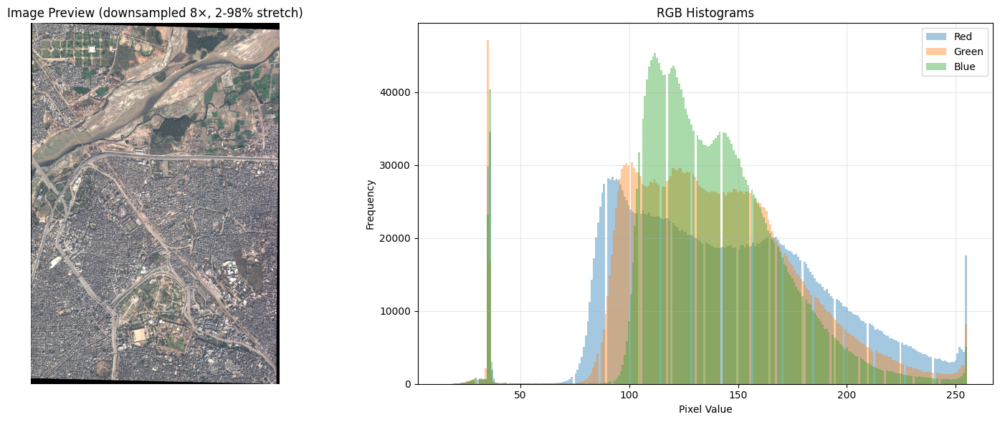


IMAGE STATISTICS
Shape (downsampled): (2010, 1380, 3)
Red  : min= 15  max=255  mean=  142.2  std=   46.3
Green: min= 16  max=255  mean=  139.1  std=   38.8
Blue : min= 18  max=255  mean=  137.8  std=   32.8


In [21]:
print("\n=== SR OUTPUT IMAGE ===")
display_png_overview(sr_path, scale_factor=8)

In [ ]:
print("\n=== LR DEGRADED IMAGE ===")
display_png_overview(lr_path, scale_factor=8)


=== HR REFERENCE IMAGE ===
[PNG Tiled Loader]
  Original size: 11040 × 16084
  Scale factor: 8×
  Output size: 1380 × 2010
  Tile size: 512
  Progress: 70/704 tiles
  Progress: 70/704 tiles
  Progress: 140/704 tiles
  Progress: 140/704 tiles
  Progress: 210/704 tiles
  Progress: 210/704 tiles
  Progress: 280/704 tiles
  Progress: 280/704 tiles
  Progress: 350/704 tiles
  Progress: 350/704 tiles
  Progress: 420/704 tiles
  Progress: 420/704 tiles
  Progress: 490/704 tiles
  Progress: 490/704 tiles
  Progress: 560/704 tiles
  Progress: 560/704 tiles
  Progress: 630/704 tiles
  Progress: 630/704 tiles
  Progress: 700/704 tiles
  Progress: 700/704 tiles
  Progress: 704/704 tiles
  Progress: 704/704 tiles
  ✓ Loaded successfully


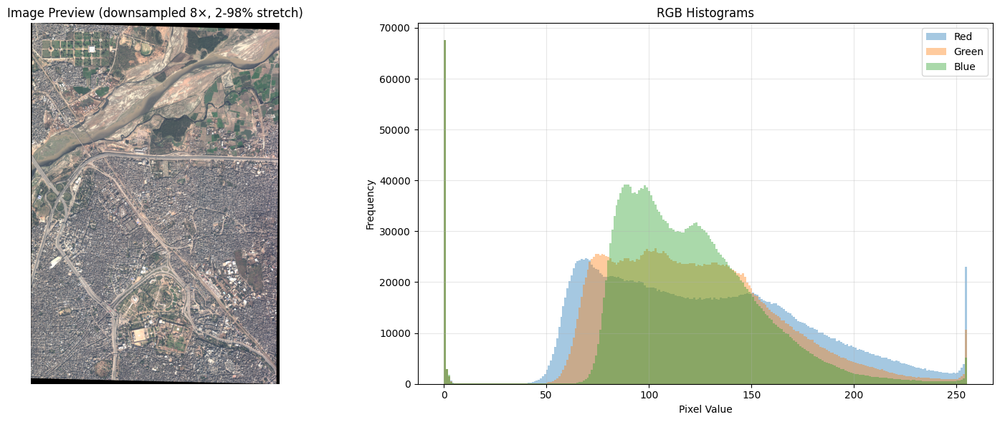


IMAGE STATISTICS
Shape (downsampled): (2010, 1380, 3)
Red  : min=  0  max=255  mean=  123.7  std=   52.7
Green: min=  0  max=255  mean=  119.7  std=   44.1
Blue : min=  0  max=255  mean=  117.7  std=   37.0


In [22]:
print("\n=== HR REFERENCE IMAGE ===")
display_png_overview(hr_path, scale_factor=8)

## 5. Predefined Center Patch Analysis

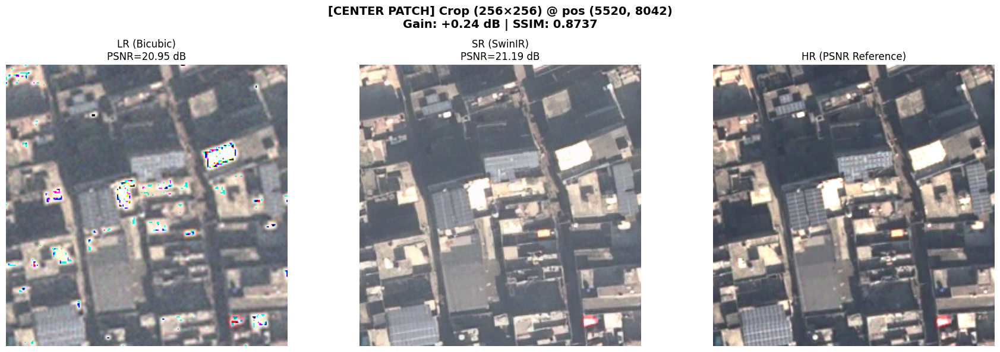


[CENTER PATCH] Patch Analysis at (5520, 8042)
SR-PSNR:      21.19 dB
SR-SSIM:      0.8737
Bicubic-PSNR: 20.95 dB
Bicubic-SSIM: 0.8361
PSNR Gain:    +0.24 dB  ✓ SR better!


In [23]:
# Analyze center patch
sr_crop, hr_crop, lr_upsampled, psnr_sr_hr, ssim_sr_hr, psnr_bic_hr, ssim_bic_hr = analyze_patch(
    crop_size=256,
    title_prefix="[CENTER PATCH] "
)

## 6. Custom Patch Analysis - USER INPUT

Image dimensions: 11040 × 16084
Requesting patch at (8000, 12000) with size 256


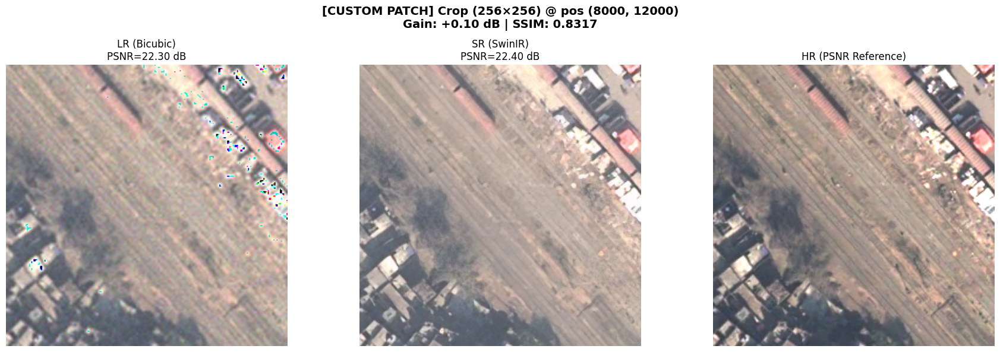


[CUSTOM PATCH] Patch Analysis at (8000, 12000)
SR-PSNR:      22.40 dB
SR-SSIM:      0.8317
Bicubic-PSNR: 22.30 dB
Bicubic-SSIM: 0.8170
PSNR Gain:    +0.10 dB  ✓ SR better!


In [24]:
# ===================================================
# CUSTOMIZE THESE VALUES
# ===================================================

custom_patch_x = 8000   # X coordinate (0 to sr_img.shape[1])
custom_patch_y = 12000  # Y coordinate (0 to sr_img.shape[0])
custom_patch_size = 256 # Patch size (recommended: 128-512)

# Bounds check
sr_h, sr_w = sr_img.shape[:2]
custom_patch_x = max(0, min(custom_patch_x, sr_w - 1))
custom_patch_y = max(0, min(custom_patch_y, sr_h - 1))

print(f"Image dimensions: {sr_w} × {sr_h}")
print(f"Requesting patch at ({custom_patch_x}, {custom_patch_y}) with size {custom_patch_size}")

sr_crop_custom, hr_crop_custom, lr_custom, psnr_custom_sr, ssim_custom_sr, psnr_custom_bic, ssim_custom_bic = analyze_patch(
    crop_size=custom_patch_size,
    center_x=custom_patch_x,
    center_y=custom_patch_y,
    title_prefix="[CUSTOM PATCH] "
)

## 7. Frequency Analysis for Center Patch

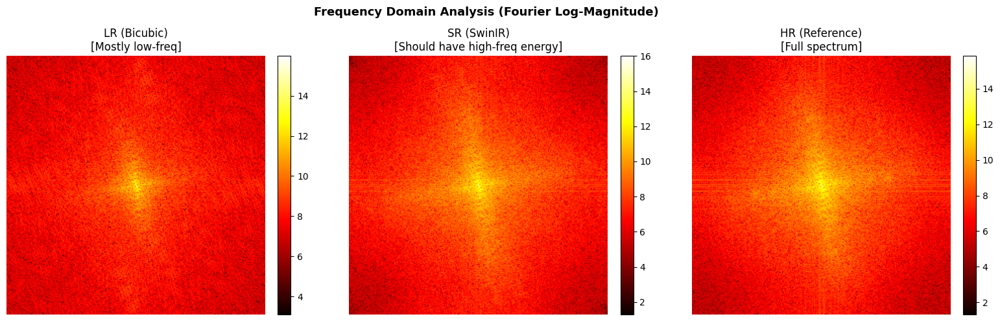

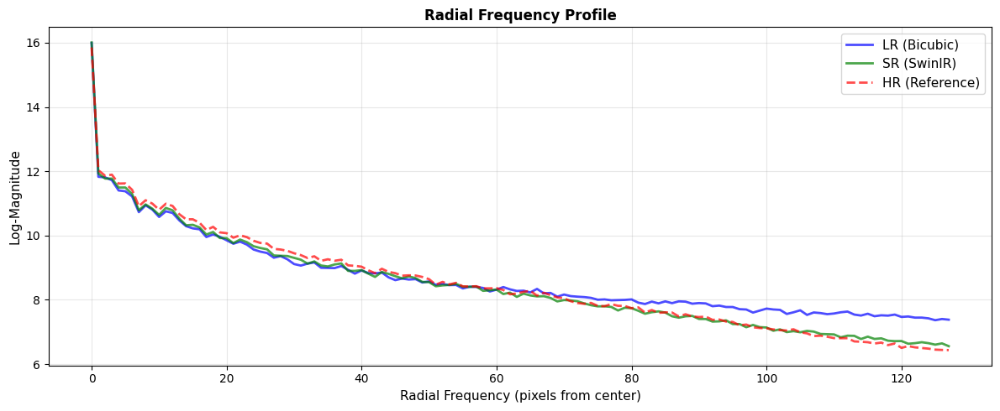


Frequency Analysis Summary:
  High-freq (outer 20%):  LR=7.50  SR=6.76  HR=6.63
  ✗ Low-frequency boost only


In [25]:
def get_frequency_spectrum(img_crop):
    """Compute power spectrum in frequency domain"""
    if img_crop.ndim == 3:
        gray = cv2.cvtColor((img_crop * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY).astype(np.float32)
    else:
        gray = img_crop.astype(np.float32)
    
    fft = np.fft.fft2(gray)
    fft_shift = np.fft.fftshift(fft)
    magnitude = np.abs(fft_shift)
    log_mag = np.log1p(magnitude)
    return log_mag

def compute_radial_spectrum(log_mag):
    """Average power at each radial frequency distance"""
    h, w = log_mag.shape
    cy, cx = h // 2, w // 2
    
    y, x = np.ogrid[:h, :w]
    distance = np.sqrt((y - cy)**2 + (x - cx)**2).astype(int)
    
    radii = np.arange(0, min(h, w) // 2)
    radial_profile = []
    
    for r in radii:
        mask = distance == r
        if mask.sum() > 0:
            radial_profile.append(log_mag[mask].mean())
        else:
            radial_profile.append(0)
    
    return np.array(radial_profile)

# Compute spectra
spectrum_lr = get_frequency_spectrum(lr_upsampled)
spectrum_sr = get_frequency_spectrum(sr_crop)
spectrum_hr = get_frequency_spectrum(hr_crop)

# Display spectra
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

im0 = axes[0].imshow(spectrum_lr, cmap="hot")
axes[0].set_title("LR (Bicubic)\n[Mostly low-freq]")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(spectrum_sr, cmap="hot")
axes[1].set_title("SR (SwinIR)\n[Should have high-freq energy]")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

im2 = axes[2].imshow(spectrum_hr, cmap="hot")
axes[2].set_title("HR (Reference)\n[Full spectrum]")
axes[2].axis("off")
plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.suptitle("Frequency Domain Analysis (Fourier Log-Magnitude)\n", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# Radial profiles
profile_lr = compute_radial_spectrum(spectrum_lr)
profile_sr = compute_radial_spectrum(spectrum_sr)
profile_hr = compute_radial_spectrum(spectrum_hr)

plt.figure(figsize=(12, 5))
radii = np.arange(len(profile_lr))

plt.plot(radii, profile_lr, 'b-', linewidth=2, label="LR (Bicubic)", alpha=0.7)
plt.plot(radii, profile_sr, 'g-', linewidth=2, label="SR (SwinIR)", alpha=0.7)
plt.plot(radii, profile_hr, 'r--', linewidth=2, label="HR (Reference)", alpha=0.7)

plt.xlabel("Radial Frequency (pixels from center)", fontsize=11)
plt.ylabel("Log-Magnitude", fontsize=11)
plt.title("Radial Frequency Profile", fontsize=12, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nFrequency Analysis Summary:")
print(f"  High-freq (outer 20%):  LR={profile_lr[-20:].mean():.2f}  SR={profile_sr[-20:].mean():.2f}  HR={profile_hr[-20:].mean():.2f}")
print(f"  {'✓ SR recovering high-freq!' if profile_sr[-20:].mean() > profile_lr[-20:].mean() else '✗ Low-frequency boost only'}")

## 8. Error & Residual Maps

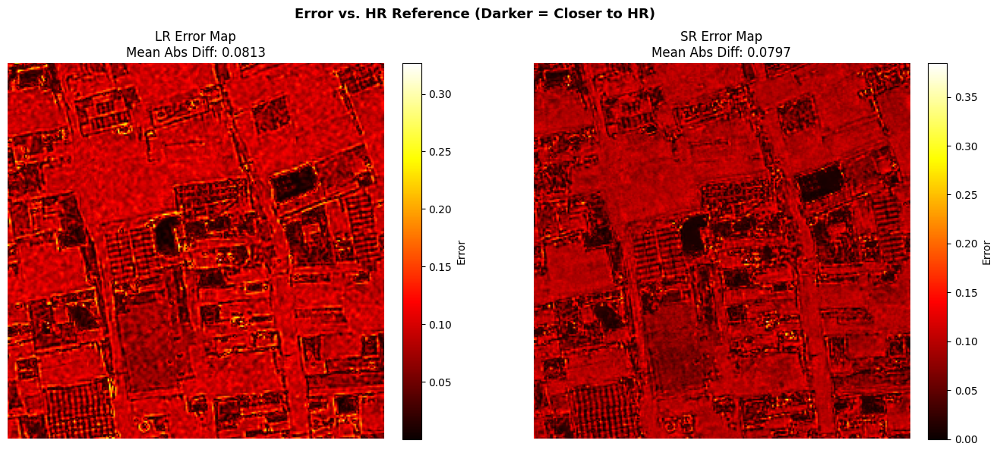


Error Statistics:
  LR Mean Error:  0.0813  (Std: 0.0354)
  SR Mean Error:  0.0797  (Std: 0.0343)
  Error Reduction: 2.1%
  ✓ SR reduced error!


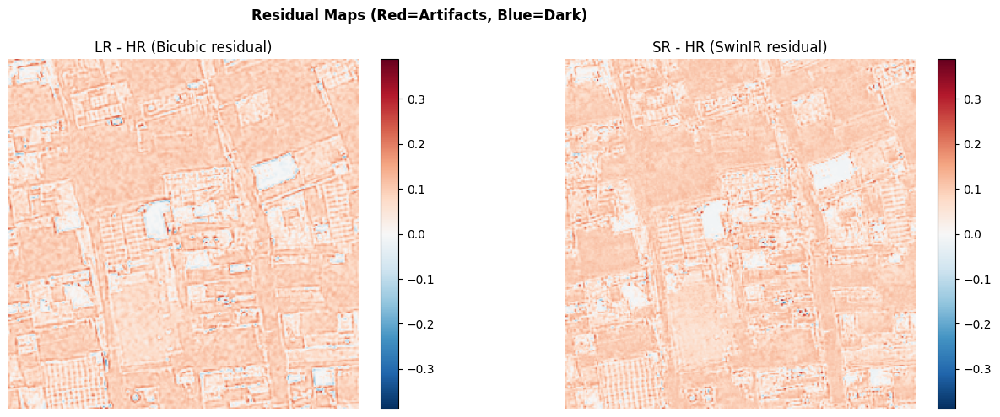

In [26]:
# Compute error maps
err_lr = np.abs(lr_upsampled - hr_crop).mean(axis=2)
err_sr = np.abs(sr_crop - hr_crop).mean(axis=2)

# Display error maps
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

im0 = axes[0].imshow(err_lr, cmap="hot")
axes[0].set_title(f"LR Error Map\nMean Abs Diff: {err_lr.mean():.4f}")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], label="Error", fraction=0.046, pad=0.04)

im1 = axes[1].imshow(err_sr, cmap="hot")
axes[1].set_title(f"SR Error Map\nMean Abs Diff: {err_sr.mean():.4f}")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], label="Error", fraction=0.046, pad=0.04)

plt.suptitle("Error vs. HR Reference (Darker = Closer to HR)", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\nError Statistics:")
print(f"  LR Mean Error:  {err_lr.mean():.4f}  (Std: {err_lr.std():.4f})")
print(f"  SR Mean Error:  {err_sr.mean():.4f}  (Std: {err_sr.std():.4f})")
print(f"  Error Reduction: {(err_lr.mean() - err_sr.mean()) / err_lr.mean() * 100:.1f}%")
print(f"  {'✓ SR reduced error!' if err_sr.mean() < err_lr.mean() else '✗ No improvement'}")

# Residual maps
residual_sr = sr_crop - hr_crop
residual_lr = lr_upsampled - hr_crop

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
vmax = max(np.abs(residual_lr).max(), np.abs(residual_sr).max())

im0 = axes[0].imshow(residual_lr.mean(axis=2), cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[0].set_title("LR - HR (Bicubic residual)")
axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

im1 = axes[1].imshow(residual_sr.mean(axis=2), cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[1].set_title("SR - HR (SwinIR residual)")
axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

plt.suptitle("Residual Maps (Red=Artifacts, Blue=Dark)", fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

## 9. Random Patch Sampling


[Random Patch 1/10] at (7270, 15795)


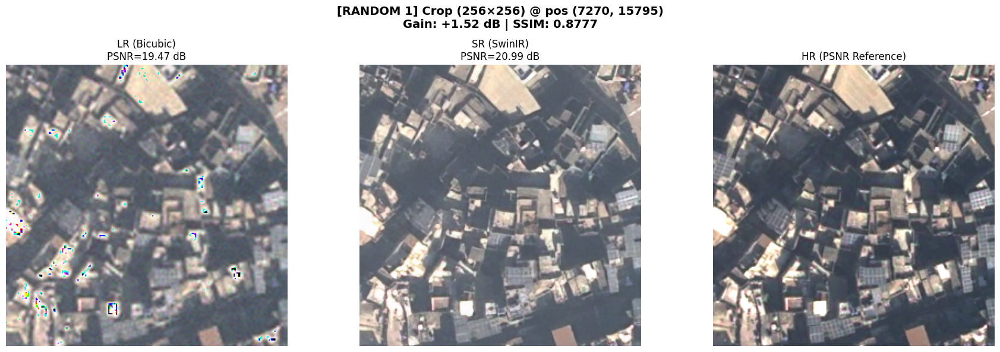


[RANDOM 1] Patch Analysis at (7270, 15795)
SR-PSNR:      20.99 dB
SR-SSIM:      0.8777
Bicubic-PSNR: 19.47 dB
Bicubic-SSIM: 0.7541
PSNR Gain:    +1.52 dB  ✓ SR better!

[Random Patch 2/10] at (860, 5390)


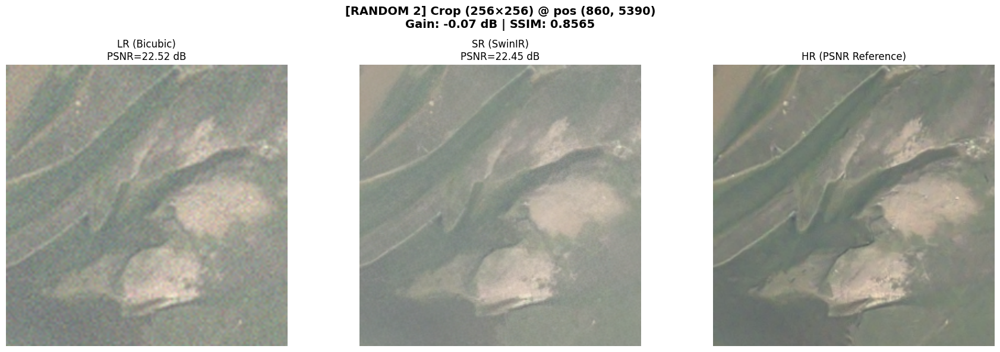


[RANDOM 2] Patch Analysis at (860, 5390)
SR-PSNR:      22.45 dB
SR-SSIM:      0.8565
Bicubic-PSNR: 22.52 dB
Bicubic-SSIM: 0.7659
PSNR Gain:    -0.07 dB  ✗ Worse

[Random Patch 3/10] at (5191, 11964)


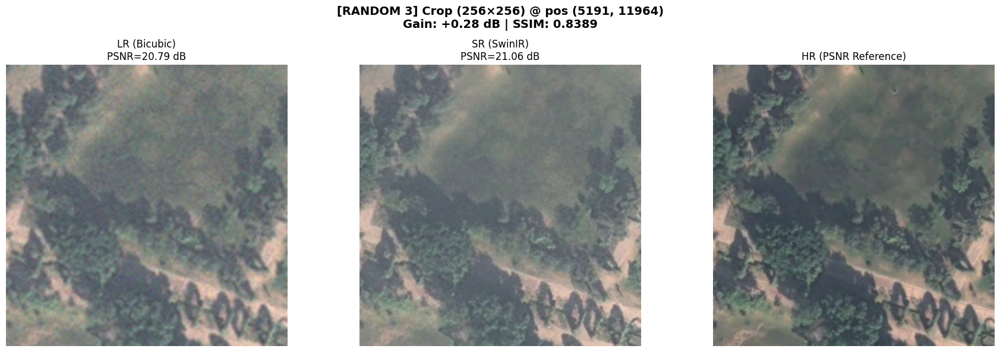


[RANDOM 3] Patch Analysis at (5191, 11964)
SR-PSNR:      21.06 dB
SR-SSIM:      0.8389
Bicubic-PSNR: 20.79 dB
Bicubic-SSIM: 0.7549
PSNR Gain:    +0.28 dB  ✓ SR better!

[Random Patch 4/10] at (5734, 6265)


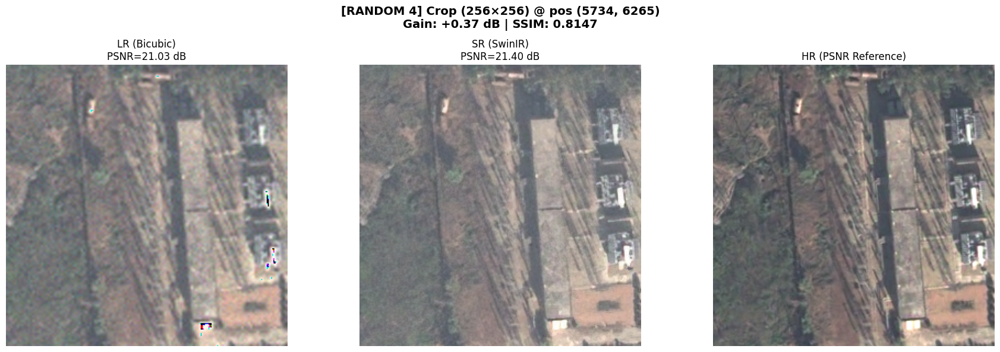


[RANDOM 4] Patch Analysis at (5734, 6265)
SR-PSNR:      21.40 dB
SR-SSIM:      0.8147
Bicubic-PSNR: 21.03 dB
Bicubic-SSIM: 0.7415
PSNR Gain:    +0.37 dB  ✓ SR better!

[Random Patch 5/10] at (466, 13526)


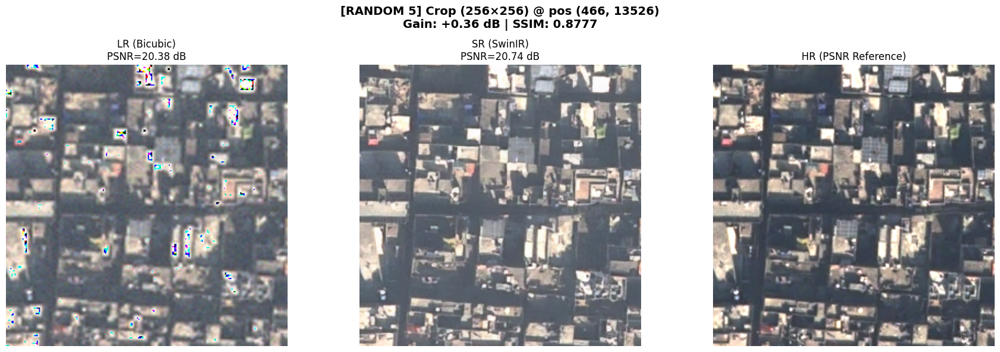


[RANDOM 5] Patch Analysis at (466, 13526)
SR-PSNR:      20.74 dB
SR-SSIM:      0.8777
Bicubic-PSNR: 20.38 dB
Bicubic-SSIM: 0.8461
PSNR Gain:    +0.36 dB  ✓ SR better!

[Random Patch 6/10] at (4426, 5578)


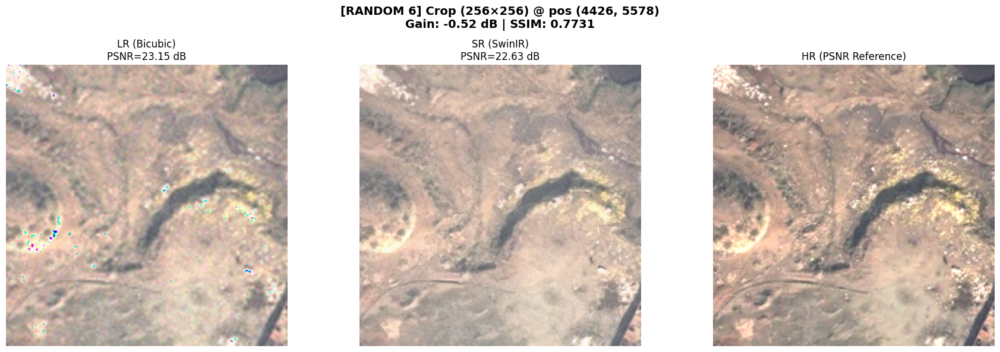


[RANDOM 6] Patch Analysis at (4426, 5578)
SR-PSNR:      22.63 dB
SR-SSIM:      0.7731
Bicubic-PSNR: 23.15 dB
Bicubic-SSIM: 0.7911
PSNR Gain:    -0.52 dB  ✗ Worse

[Random Patch 7/10] at (8322, 1685)


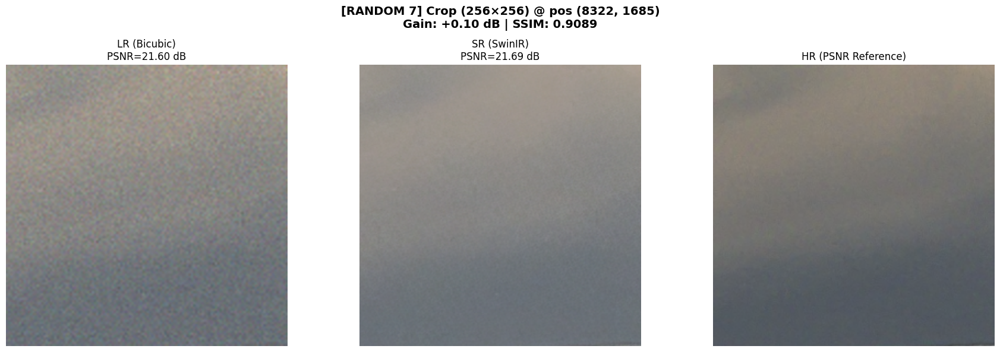


[RANDOM 7] Patch Analysis at (8322, 1685)
SR-PSNR:      21.69 dB
SR-SSIM:      0.9089
Bicubic-PSNR: 21.60 dB
Bicubic-SSIM: 0.7361
PSNR Gain:    +0.10 dB  ✓ SR better!

[Random Patch 8/10] at (769, 10583)


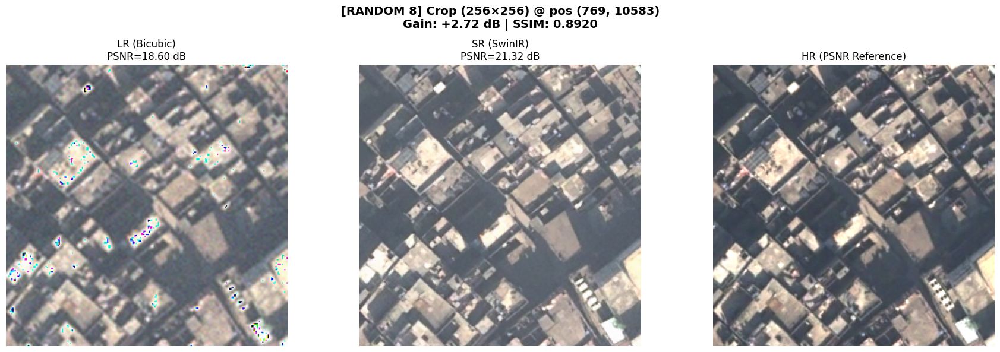


[RANDOM 8] Patch Analysis at (769, 10583)
SR-PSNR:      21.32 dB
SR-SSIM:      0.8920
Bicubic-PSNR: 18.60 dB
Bicubic-SSIM: 0.6683
PSNR Gain:    +2.72 dB  ✓ SR better!

[Random Patch 9/10] at (6949, 2433)


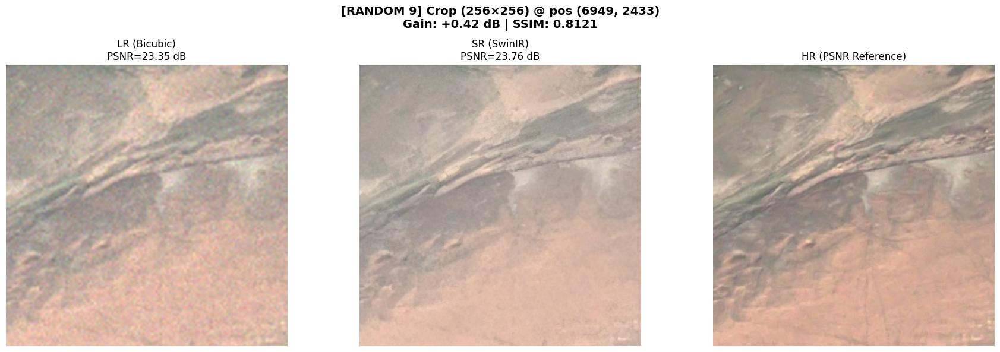


[RANDOM 9] Patch Analysis at (6949, 2433)
SR-PSNR:      23.76 dB
SR-SSIM:      0.8121
Bicubic-PSNR: 23.35 dB
Bicubic-SSIM: 0.6416
PSNR Gain:    +0.42 dB  ✓ SR better!

[Random Patch 10/10] at (5311, 5051)


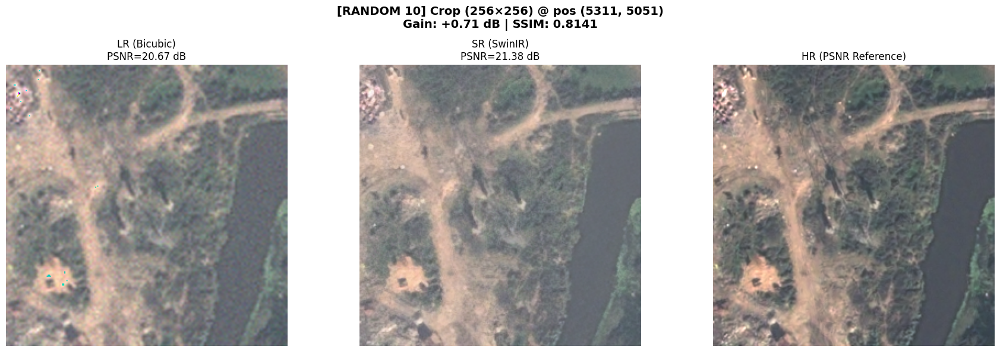


[RANDOM 10] Patch Analysis at (5311, 5051)
SR-PSNR:      21.38 dB
SR-SSIM:      0.8141
Bicubic-PSNR: 20.67 dB
Bicubic-SSIM: 0.6525
PSNR Gain:    +0.71 dB  ✓ SR better!


RANDOM SAMPLING SUMMARY

Average PSNR Gain: +0.59 dB (±0.87)
Average SR PSNR: 21.74 dB (±0.89)
Average SR SSIM: 0.8466 (±0.0409)
Min Gain: -0.52 dB
Max Gain: +2.72 dB

Positive gains (SR better): 8/10


In [27]:
# ===================================================
# CUSTOMIZE THESE VALUES
# ===================================================

num_random_patches = 10  # Number of random patches to sample
random_patch_size = 256  # Size of each random patch
random_seed = 42  # For reproducibility

np.random.seed(random_seed)
sr_h, sr_w = sr_img.shape[:2]

results = []

for i in range(num_random_patches):
    # Random position
    x = np.random.randint(0, max(1, sr_w - random_patch_size))
    y = np.random.randint(0, max(1, sr_h - random_patch_size))
    
    print(f"\n[Random Patch {i+1}/{num_random_patches}] at ({x}, {y})")
    
    sr_crop_r, hr_crop_r, lr_crop_r, psnr_sr_r, ssim_sr_r, psnr_bic_r, ssim_bic_r = analyze_patch(
        crop_size=random_patch_size,
        center_x=x,
        center_y=y,
        title_prefix=f"[RANDOM {i+1}] "
    )
    
    results.append({
        'x': x, 'y': y,
        'sr_psnr': psnr_sr_r, 'sr_ssim': ssim_sr_r,
        'bic_psnr': psnr_bic_r, 'bic_ssim': ssim_bic_r,
        'gain': psnr_sr_r - psnr_bic_r
    })

# Summary statistics
print(f"\n\n{'='*70}")
print("RANDOM SAMPLING SUMMARY")
print(f"{'='*70}")

gains = [r['gain'] for r in results]
sr_psnrs = [r['sr_psnr'] for r in results]
sr_ssims = [r['sr_ssim'] for r in results]

print(f"\nAverage PSNR Gain: {np.mean(gains):+.2f} dB (±{np.std(gains):.2f})")
print(f"Average SR PSNR: {np.mean(sr_psnrs):.2f} dB (±{np.std(sr_psnrs):.2f})")
print(f"Average SR SSIM: {np.mean(sr_ssims):.4f} (±{np.std(sr_ssims):.4f})")
print(f"Min Gain: {np.min(gains):+.2f} dB")
print(f"Max Gain: {np.max(gains):+.2f} dB")
print(f"\nPositive gains (SR better): {sum(1 for g in gains if g > 0)}/{len(gains)}")

## 10. Interpretation Guide & Pass/Fail Criteria

In [28]:
interpretation = """
╔════════════════════════════════════════════════════════════════════════╗
║                    SR QUALITY ASSESSMENT GUIDE                         ║
╚════════════════════════════════════════════════════════════════════════╝

1. METRIC COMPARISON (vs. HR reference)
   ├─ PSNR (Peak Signal-to-Noise Ratio)
   │  ├─ Higher is better (typical: 25-35 dB)
   │  ├─ SR-PSNR > Bicubic-PSNR → ✓ SR is sharpening
   │  └─ Gain of 2-3 dB suggests good restoration
   │
   ├─ SSIM (Structural Similarity Index)
   │  ├─ Range: 0 to 1 (1 = perfect)
   │  ├─ Typical: 0.7-0.95
   │  └─ SR-SSIM > Bicubic-SSIM → ✓ Better structure preservation
   │
   └─ Visual Inspection
      ├─ LR (Bicubic): Blurry, soft edges
      ├─ SR (SwinIR):  Should have crisp edges, recovered texture
      └─ HR (Reference): Ground truth

2. FREQUENCY ANALYSIS
   ├─ LR spectrum: Energy concentrated at LOW frequencies (blurry)
   ├─ HR spectrum: Energy spread across ALL frequencies (sharp)
   └─ SR spectrum: Should be CLOSER to HR than LR
      └─ If SR ≈ LR → ✗ Model not working
      └─ If SR ≈ HR → ✓ Good restoration

3. ERROR MAPS
   ├─ Darker regions = closer to HR (better)
   ├─ SR error < LR error → ✓ Model improving
   ├─ Structured patterns → ✗ Model hallucinating
   └─ Random noise patterns → ✓ Normal (harder pixels)

4. RESIDUAL ANALYSIS
   ├─ Residual = Output - HR Reference
   ├─ Red regions: Output too bright → Artifacts
   ├─ Blue regions: Output too dark → Artifacts
   ├─ Gray/neutral: Close to HR ✓
   └─ SR residual should be smaller than LR residual

═══════════════════════════════════════════════════════════════════════════

✓ YOUR SR IS WORKING if:
  • PSNR gain ≥ 1.5 dB over bicubic (consistently across patches)
  • SSIM ≥ 0.85 (very good structural match)
  • Frequency spectrum similar to HR (especially high-freq boost)
  • Error maps show darker regions for SR
  • Visual inspection shows crisp edges and recovered details
  • Random sampling shows majority of patches with positive gain

⚠ WARNING SIGNS (model not working):
  • PSNR loss compared to bicubic
  • SSIM < 0.7 or degrading
  • SR spectrum identical to LR (just blurry copy)
  • Colored artifacts in residuals
  • Heavy noise amplification
  • Inconsistent results across patches

═══════════════════════════════════════════════════════════════════════════

NEXT STEPS:
1. Sample multiple regions with different characteristics
2. Test at different upsampling factors (2×, 3×, 4×)
3. Compare with other baselines (ESRGAN, Real-ESRGAN)
4. Check log file for average metrics across entire dataset
5. If issues found, retrain with different hyperparameters
"""

print(interpretation)


╔════════════════════════════════════════════════════════════════════════╗
║                    SR QUALITY ASSESSMENT GUIDE                         ║
╚════════════════════════════════════════════════════════════════════════╝

1. METRIC COMPARISON (vs. HR reference)
   ├─ PSNR (Peak Signal-to-Noise Ratio)
   │  ├─ Higher is better (typical: 25-35 dB)
   │  ├─ SR-PSNR > Bicubic-PSNR → ✓ SR is sharpening
   │  └─ Gain of 2-3 dB suggests good restoration
   │
   ├─ SSIM (Structural Similarity Index)
   │  ├─ Range: 0 to 1 (1 = perfect)
   │  ├─ Typical: 0.7-0.95
   │  └─ SR-SSIM > Bicubic-SSIM → ✓ Better structure preservation
   │
   └─ Visual Inspection
      ├─ LR (Bicubic): Blurry, soft edges
      ├─ SR (SwinIR):  Should have crisp edges, recovered texture
      └─ HR (Reference): Ground truth

2. FREQUENCY ANALYSIS
   ├─ LR spectrum: Energy concentrated at LOW frequencies (blurry)
   ├─ HR spectrum: Energy spread across ALL frequencies (sharp)
   └─ SR spectrum: Should be CLOSER to 